# RHT Comparative Analysis

### Fluorescence intensity profiling of retinohypothalamic tract axon terminals in the SCN

Anterograde tracing was used to compare retinohypothalamic tract (RHT) innervation of the
suprachiasmatic nucleus (SCN) between wild-type and melanopsin (*Opn4*) knockout mice.
Each animal received a dual-eye injection of spectrally distinct tracers, so the red and
green channels report the projections of the two eyes independently within the same section.

**Design.** WT (N = 10) vs KO (N = 10); one coronal section through the SCN per animal;
two fluorescence channels (red, green) per section.

**Question.** Does loss of melanopsin alter the amount or the spatial distribution of RHT
axon terminal label in the SCN, and if so, on which side of the midline?

This notebook presents the complete analysis: the raw group images, every intermediate
processing and quality-control step, the alignment used to bring animals into a common
coordinate frame, the statistical tests, and the interpretation. Image processing was
performed in MATLAB (`matlab/RHT_Comparative_Analysis_SpeerLab.m`); this notebook loads and
displays that pipeline's outputs. Every statistic reported below is parsed directly from the
pipeline's result files at run time rather than transcribed, so the text cannot drift from
the data.

## Running this notebook

The notebook reads only from the `data/` directory, which contains the outputs of the MATLAB
pipeline. It performs no image processing of its own, so it runs in seconds and requires no
MATLAB license.

```
pip install -r requirements.txt
jupyter notebook RHT_Comparative_Analysis.ipynb
```

Keep `data/` in the same directory as the notebook. To reproduce the contents of `data/`
from the raw microscopy images, run the MATLAB pipeline in `matlab/`.

## 1. Setup and analysis parameters

The parameters below mirror the configuration block of the MATLAB pipeline. They are restated
here so that the figures in this notebook carry the correct physical scale and so that the
group sizes and bin widths are visible alongside the results rather than buried in the code.

In [1]:
from pathlib import Path
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- Paths -----------------------------------------------------------------
DATA   = Path("data")
STEP1  = DATA / "01_Linear_Stretch" / "Montages"
STEP2  = DATA / "02_Histograms" / "Montages"
STEP3  = DATA / "03_Alignment_with_Stats"
STATS  = STEP3 / "Statistical_Analysis"
HEAT   = DATA / "05_Heatmaps"
AVG    = DATA / "06_Average_Images"

# ---- Acquisition and analysis parameters (from the MATLAB config) ----------
PIXEL_SIZE_UM   = 0.6313131   # microns per pixel
BIN_ALIGNMENT   = 80          # pixel bin width used for valley detection / alignment
BIN_ANALYSIS    = 20          # pixel bin width used for profiles and statistics
ALPHA           = 0.05        # significance threshold
POWER_THRESHOLD = 0.80        # post-hoc power required to call a result robust

CHANNELS  = ["Red", "Green"]
GENOTYPES = ["WT", "KO"]

print(f"Analysis bin: {BIN_ANALYSIS} px ({BIN_ANALYSIS * PIXEL_SIZE_UM:.1f} um)")
print(f"Alignment bin: {BIN_ALIGNMENT} px ({BIN_ALIGNMENT * PIXEL_SIZE_UM:.1f} um)")
print(f"Robust result requires p < {ALPHA} and power > {POWER_THRESHOLD}")

Analysis bin: 20 px (12.6 um)
Alignment bin: 80 px (50.5 um)
Robust result requires p < 0.05 and power > 0.8


In [2]:
from PIL import Image

# The pipeline exports figures at 600-900 dpi (some exceed 50 megapixels). They are
# downsampled here purely for on-screen display; the full-resolution files in data/
# are untouched and remain the ones to use for publication figures.
Image.MAX_IMAGE_PIXELS = None
MAX_DISPLAY_WIDTH_PX = 1800


def load_display(path):
    # Load a figure and downsample it to a size sensible for screen display.
    path = Path(path)
    if not path.exists():
        raise FileNotFoundError(path)
    img = Image.open(path)
    img.draft("RGB", (MAX_DISPLAY_WIDTH_PX, MAX_DISPLAY_WIDTH_PX))
    img = img.convert("RGB")
    if img.width > MAX_DISPLAY_WIDTH_PX:
        scale = MAX_DISPLAY_WIDTH_PX / img.width
        img = img.resize((MAX_DISPLAY_WIDTH_PX, max(1, round(img.height * scale))),
                         Image.LANCZOS)
    return np.asarray(img)


def show(path, title=None, width=15):
    img = load_display(path)
    h, w = img.shape[:2]
    fig, ax = plt.subplots(figsize=(width, width * h / w))
    ax.imshow(img)
    ax.axis("off")
    if title:
        ax.set_title(title, fontsize=13, pad=8)
    plt.tight_layout()
    plt.show()
    plt.close(fig)


def show_grid(paths, titles, ncols=2, width=16):
    imgs = [load_display(p) for p in paths]
    nrows = int(np.ceil(len(imgs) / ncols))
    h, w = imgs[0].shape[:2]
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(width, width / ncols * h / w * nrows))
    axes = np.atleast_1d(axes).ravel()
    for ax, img, t in zip(axes, imgs, titles):
        ax.imshow(img)
        ax.set_title(t, fontsize=12)
        ax.axis("off")
    for ax in axes[len(imgs):]:
        ax.axis("off")
    plt.tight_layout()
    plt.show()
    plt.close(fig)

## 2. Coordinate frame and the definition of "ipsilateral"

This section fixes the convention that governs every result below.

Each image spans both SCN lobes, which are separated by a trough of low fluorescence at the
midline. The analysis uses that trough as the origin: after alignment, **x = 0 is the SCN
midline**, negative x is the left half of the image and positive x is the right half. Each
profile is split at x = 0 and the two halves are compared between genotypes.

Left and right are **image coordinates**. Ipsilateral and contralateral are defined relative to
the **injected eye**, and the two are not interchangeable. Because the two eyes were injected
with spectrally distinct tracers, each channel reports one eye, and each eye's ipsilateral SCN
lobe lies on its own side. The two channels therefore have their ipsilateral targets on
*opposite* halves of the same image:

| Channel | Ipsilateral half | Contralateral half |
|---------|------------------|--------------------|
| Red     | x < 0            | x > 0              |
| Green   | x > 0            | x < 0              |

This mapping is declared once, in the cell below, and every subsequent figure, table and
statement in this notebook derives its laterality labels from it.

In [3]:
# Mapping from image half to laterality, per channel.
# "negative" = x < 0 (left of the midline); "positive" = x > 0 (right of the midline).
# The two eyes were injected with different tracers, so each channel's ipsilateral SCN
# lobe lies on the opposite half of the image from the other channel's.
IPSI_HALF = {
    "Red":   "negative",
    "Green": "positive",
}
CONTRA_HALF = {ch: ("positive" if half == "negative" else "negative")
               for ch, half in IPSI_HALF.items()}

SIGN = {"negative": "x < 0", "positive": "x > 0"}

for ch in CHANNELS:
    print(f"{ch:>5} channel:  ipsilateral = {SIGN[IPSI_HALF[ch]]:>6}   "
          f"contralateral = {SIGN[CONTRA_HALF[ch]]:>6}")

  Red channel:  ipsilateral =  x < 0   contralateral =  x > 0
Green channel:  ipsilateral =  x > 0   contralateral =  x < 0


## 3. Analysis pipeline

The MATLAB pipeline runs in three stages. The sections that follow show the output of each.

1. **Normalization.** Each channel is linearly stretched between its 1st and 99th intensity
   percentiles, computed across the whole stack of a given genotype, so that images can be
   compared without one bright section dominating.
2. **One-dimensional profiling.** Each image is collapsed along the y-axis into an intensity
   profile across x. Profiles are computed at two bin widths: a coarse bin (80 px) that is
   robust enough to locate the midline valley reliably, and a fine bin (20 px) used for
   plotting and statistics.
3. **Alignment and statistics.** The midline valley is detected in each animal's coarse
   profile, every animal is shifted so its valley sits at x = 0, and the aligned fine profiles
   are split at the midline. Each animal contributes one mean-intensity value per half, and
   WT and KO are compared with a Mann-Whitney U test.

Two versions of the profile data are analyzed in parallel throughout:

- **Original** intensities, which are sensitive to how much label is present.
- **0–1 normalized** profiles, in which each animal's profile is independently rescaled to
  the range [0, 1]. This removes overall brightness differences and is sensitive only to the
  *shape* of the distribution.

Comparing the two separates a change in the amount of label from a change in how the label is
distributed across the SCN.

## 4. Step 1 — Normalized images

Every section entering the analysis, after linear-stretch normalization. These montages are the
primary check that no section is saturated, torn, badly out of focus, or misoriented, and that
the two SCN lobes are visible in each. Animal numbers are burned into each panel.

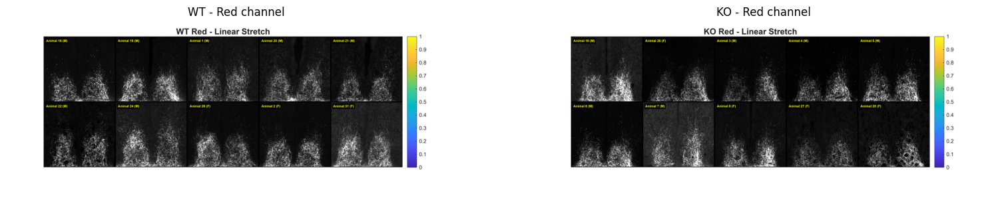

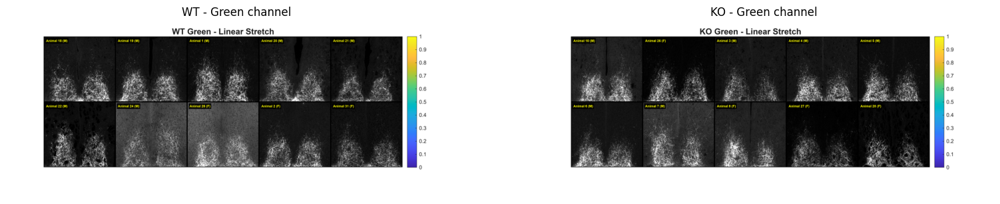

In [4]:
for ch in CHANNELS:
    show_grid(
        [STEP1 / f"Montage_WT_{ch}_LinearStretch.png",
         STEP1 / f"Montage_KO_{ch}_LinearStretch.png"],
        [f"WT - {ch} channel", f"KO - {ch} channel"],
        ncols=2, width=16,
    )

## 5. Step 2 — One-dimensional intensity profiles

Each image is collapsed into a profile of mean intensity against position along the
medial-lateral (x) axis. Every colored line is one animal; the heavy black line is the group
mean and the dashed lines are ±1 SD.

The characteristic shape is two peaks — the two SCN lobes — separated by a central trough. That
trough is the feature the alignment step keys on. Note that at this stage the animals are *not*
yet aligned: the trough sits at a slightly different x position in each animal because of small
differences in how each section was mounted and cropped. That spread is exactly what Step 3
removes.

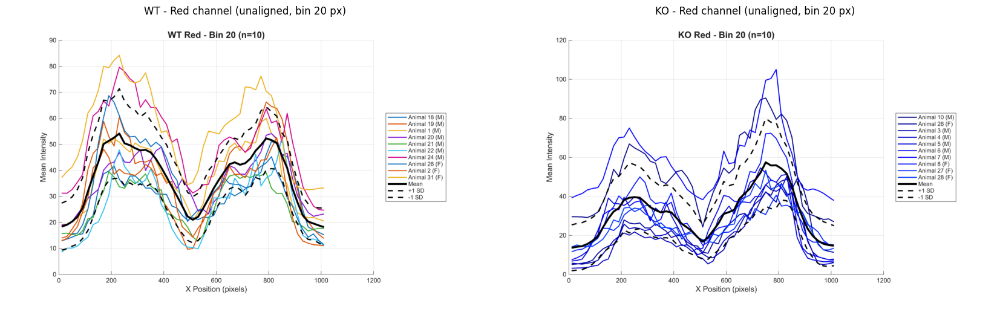

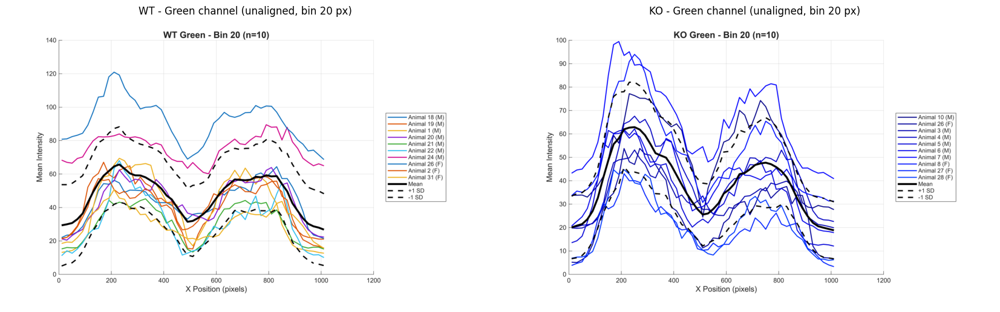

In [5]:
for ch in CHANNELS:
    show_grid(
        [STEP2 / f"Montage_WT_{ch}.png",
         STEP2 / f"Montage_KO_{ch}.png"],
        [f"WT - {ch} channel (unaligned, bin {BIN_ANALYSIS} px)",
         f"KO - {ch} channel (unaligned, bin {BIN_ANALYSIS} px)"],
        ncols=2, width=17,
    )

## 6. Step 3 — Alignment

Sections cannot be compared bin-by-bin until they share a common origin. The pipeline
establishes that origin from the anatomy itself: the midline trough between the two SCN lobes.

### 6.1 Valley detection

For each animal, the minimum of the coarse (80 px) profile is located within a restricted
search window spanning the middle of the image (x = 400-600 px), which prevents the detector
from latching onto a dark region at the edge of the section. The 80 px bin is used here
deliberately: it is coarse enough that local noise in the trough does not shift the detected
minimum, which is the failure mode that a fine bin would be vulnerable to.

The plots below show each animal's profile with its detected valley marked. The check to make
here is that the marker has landed in the central trough in every animal, not on a shoulder or
an edge.

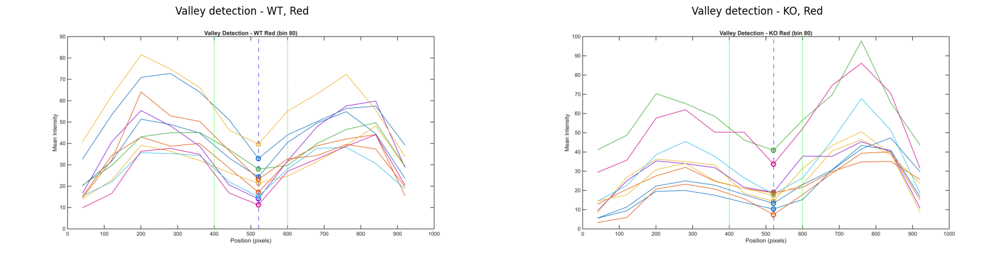

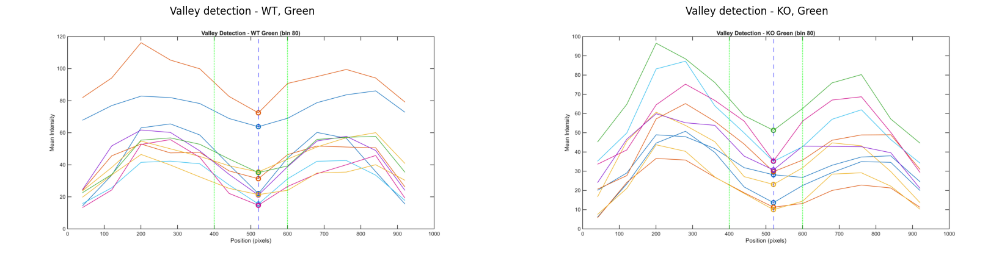

In [6]:
qc = STEP3 / "QC_Plots"
for ch in CHANNELS:
    show_grid(
        [qc / f"ValleyDetect_{ch}_WT.png", qc / f"ValleyDetect_{ch}_KO.png"],
        [f"Valley detection - WT, {ch}", f"Valley detection - KO, {ch}"],
        ncols=2, width=17,
    )

### 6.2 Applied shifts

Each animal is then translated along x so that its detected valley coincides with the group
mean valley position. Shifts are computed in units of the coarse bin, converted to pixels, and
applied to the fine (20 px) profiles used for analysis; a small intensity offset is applied at
the same time so that the valley floors coincide as well. The plots below summarize the shift
applied to each animal and the resulting alignment.

Shifts are capped at 100 px. A shift approaching that cap would indicate a section that is
grossly displaced relative to the others and would warrant inspection.

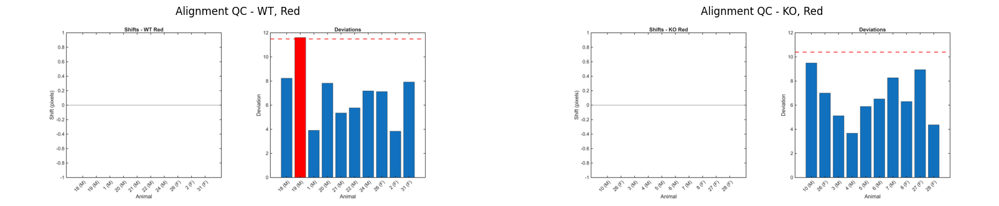

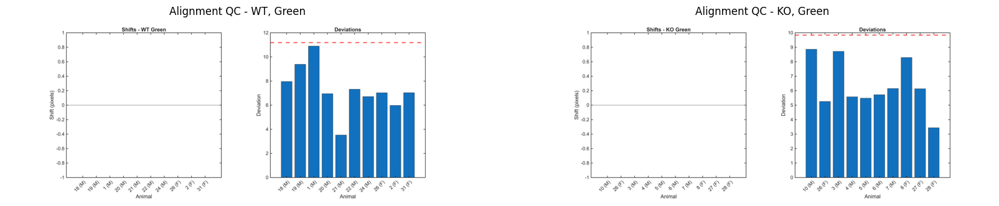

In [7]:
for ch in CHANNELS:
    show_grid(
        [qc / f"AlignmentQC_{ch}_WT.png", qc / f"AlignmentQC_{ch}_KO.png"],
        [f"Alignment QC - WT, {ch}", f"Alignment QC - KO, {ch}"],
        ncols=2, width=17,
    )

### 6.3 Before and after alignment

The direct check on whether alignment worked. On the left of each panel the individual profiles
are overlaid as acquired; on the right, after shifting. The troughs should converge onto a
single x position and the two lobes should sharpen, because peaks that were previously smeared
across animals now superimpose. If alignment were failing, the post-alignment group mean would
be no crisper than the pre-alignment one.

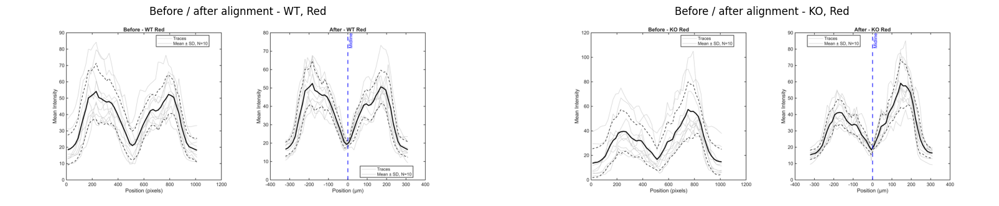

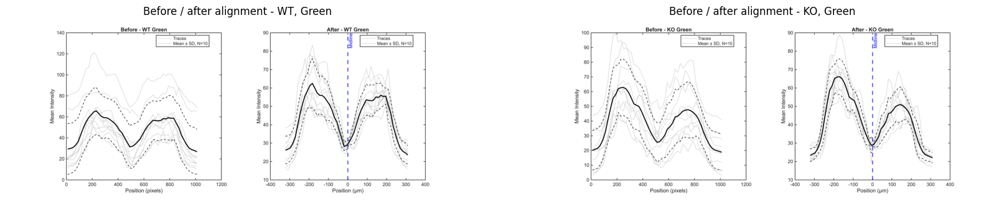

In [8]:
ba = STEP3 / "Before_After_Comparison"
for ch in CHANNELS:
    show_grid(
        [ba / f"BeforeAfter_{ch}_WT.png", ba / f"BeforeAfter_{ch}_KO.png"],
        [f"Before / after alignment - WT, {ch}", f"Before / after alignment - KO, {ch}"],
        ncols=2, width=17,
    )

### 6.4 Deviation from the group mean

Animals ranked by how far their aligned profile departs from their group's mean profile. This
is a diagnostic, not a filter: no animal was excluded from the analysis on the basis of these
plots. Their purpose is to confirm that the group differences reported later are not being
driven by one or two aberrant sections, and to make the spread within each group visible rather
than hidden inside a mean.

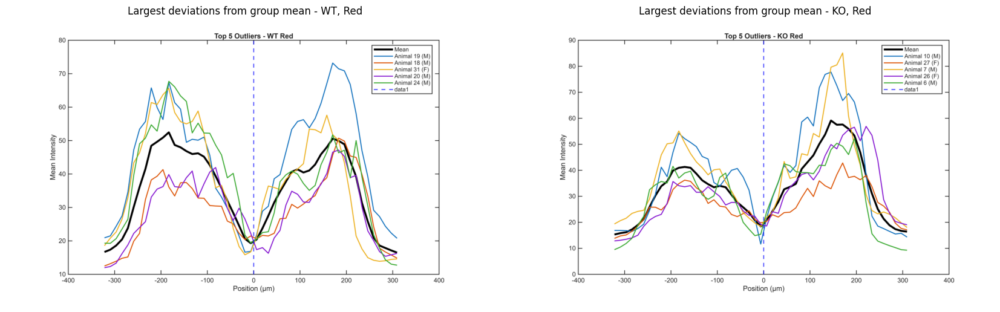

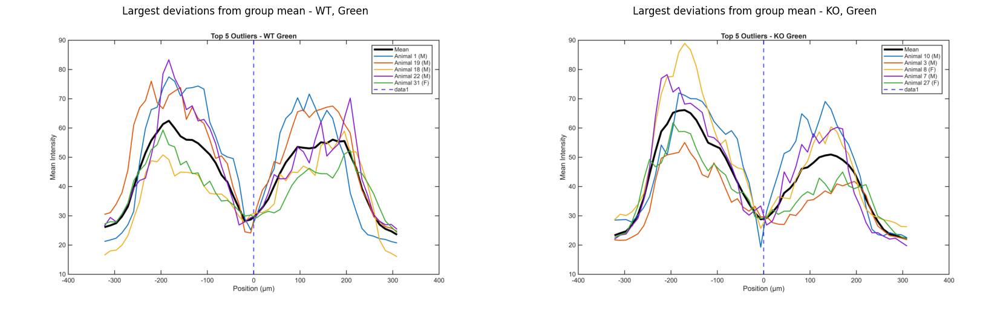

In [9]:
out = STEP3 / "Outliers"
for ch in CHANNELS:
    show_grid(
        [out / f"Top5_{ch}_WT.png", out / f"Top5_{ch}_KO.png"],
        [f"Largest deviations from group mean - WT, {ch}",
         f"Largest deviations from group mean - KO, {ch}"],
        ncols=2, width=17,
    )

## 7. Aligned group profiles

With every animal in a common coordinate frame, the group mean profiles can be compared
directly. The panels below are redrawn here from the pipeline's exported profile tables
(`Profiles_<channel>_<datatype>.csv`) so that the laterality shading can be applied correctly
for each channel: the shaded band marks the **ipsilateral** half, which is x < 0 for the red
channel and x > 0 for the green channel.

Solid lines are group means; shaded envelopes are ±1 SD across animals. The dashed vertical
line is the aligned midline.

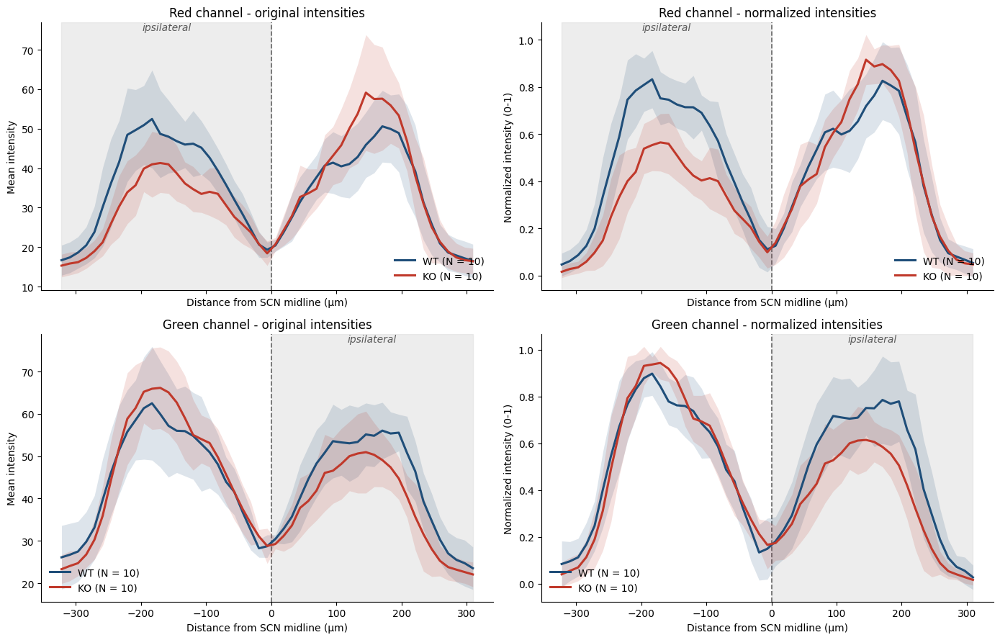

In [10]:
profiles = {}
for ch in CHANNELS:
    for dt in ["original", "normalized"]:
        profiles[(ch, dt)] = pd.read_csv(STATS / f"Profiles_{ch}_{dt}.csv")

WT_COLOR, KO_COLOR = "#1f4e79", "#c0392b"

fig, axes = plt.subplots(2, 2, figsize=(14, 9), sharex=True)

for i, ch in enumerate(CHANNELS):
    for j, dt in enumerate(["original", "normalized"]):
        ax = axes[i, j]
        d = profiles[(ch, dt)]
        x = d["Position_um"].to_numpy()

        for grp, color in [("WT", WT_COLOR), ("KO", KO_COLOR)]:
            m = d[f"{grp}_Mean"].to_numpy()
            s = d[f"{grp}_SD"].to_numpy()
            ax.plot(x, m, color=color, lw=2.2, label=f"{grp} (N = 10)", zorder=3)
            ax.fill_between(x, m - s, m + s, color=color, alpha=0.15, lw=0, zorder=2)

        # Shade the ipsilateral half for THIS channel.
        lo, hi = ax.get_ylim()
        if IPSI_HALF[ch] == "negative":
            ax.axvspan(x.min(), 0, color="0.85", alpha=0.45, zorder=0)
            ipsi_x = x.min() / 2
        else:
            ax.axvspan(0, x.max(), color="0.85", alpha=0.45, zorder=0)
            ipsi_x = x.max() / 2
        ax.text(ipsi_x, hi, "ipsilateral", ha="center", va="top",
                fontsize=10, style="italic", color="0.35")

        ax.axvline(0, color="0.4", ls="--", lw=1.2, zorder=1)
        ax.set_ylim(lo, hi)
        ax.set_title(f"{ch} channel - {dt} intensities", fontsize=12)
        ax.set_xlabel("Distance from SCN midline (\u00b5m)")
        ax.set_ylabel("Mean intensity" if dt == "original" else "Normalized intensity (0-1)")
        ax.legend(frameon=False, loc="lower left" if IPSI_HALF[ch] == "positive" else "lower right")
        ax.spines[["top", "right"]].set_visible(False)

plt.tight_layout()
plt.show()

In both channels the two curves separate over the ipsilateral half — the KO mean lies below the
WT mean there — while over the contralateral half they run close together. Because the
ipsilateral half is a different side of the image in each channel, this shows up as a
separation on the left in the red channel and on the right in the green channel. The two
channels are reporting the same effect on the two eyes, not two different effects.

The pipeline's own versions of these plots, with significance annotation and the coarse-bin
profiles, are reproduced below.

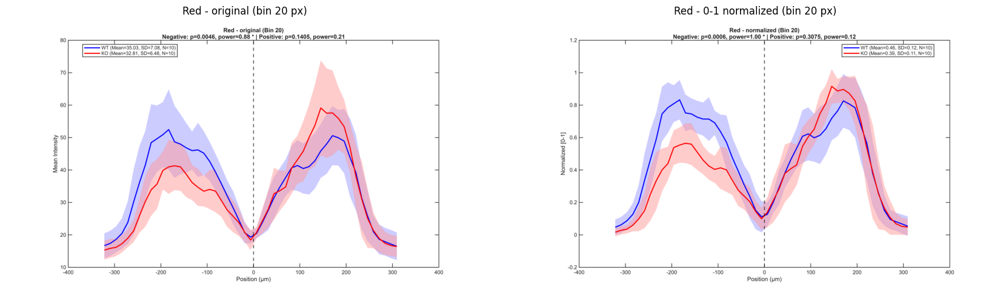

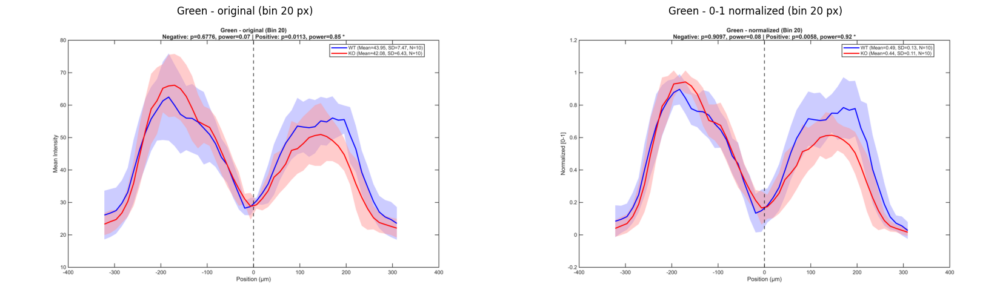

In [11]:
ap = STEP3 / "Aligned_Profiles"
for ch in CHANNELS:
    show_grid(
        [ap / f"WTvsKO_{ch}_original_bin20_blue_red.png",
         ap / f"WTvsKO_{ch}_normalized_bin20_blue_red.png"],
        [f"{ch} - original (bin {BIN_ANALYSIS} px)",
         f"{ch} - 0-1 normalized (bin {BIN_ANALYSIS} px)"],
        ncols=2, width=17,
    )

## 8. Statistics

Each animal contributes exactly one value per half — the mean intensity across all bins in that
half of its aligned profile — so the unit of analysis is the animal (N = 10 per genotype), not
the bin. This matters: treating bins as independent observations would inflate N by a factor of
25 and manufacture significance out of spatial autocorrelation.

WT and KO are compared with a **Mann-Whitney U test** (Wilcoxon rank-sum), which does not assume
normality. Effect size is Cohen's d and post-hoc power is computed from the non-central
t-distribution. A result is called robust only when **p < 0.05 and power > 0.8**.

The cell below parses the pipeline's result files directly, then relabels the negative/positive
halves as ipsilateral/contralateral using the per-channel mapping from Section 2.

In [12]:
def parse_mannwhitney(path):
    # Parse one MannWhitney_<channel>_<datatype>.txt file into two records,
    # one per half of the profile.
    text = Path(path).read_text()
    records = {}
    for half in ["NEGATIVE", "POSITIVE"]:
        block = re.search(rf"{half} HALF.*?(?=\n[A-Z]{{4,}}|\Z)", text, re.S).group(0)
        g = lambda p: float(re.search(p, block).group(1))
        records[half.lower()] = {
            "WT_mean":   g(r"WT: Mean=([-\d.]+)"),
            "WT_sd":     g(r"WT: Mean=[-\d.]+, SD=([-\d.]+)"),
            "KO_mean":   g(r"KO: Mean=([-\d.]+)"),
            "KO_sd":     g(r"KO: Mean=[-\d.]+, SD=([-\d.]+)"),
            "U":         g(r"U statistic: ([-\d.]+)"),
            "p":         g(r"p-value: ([-\d.]+)"),
            "cohens_d":  g(r"Cohen's d: ([-\d.]+)"),
            "power":     g(r"Post-hoc power: ([-\d.]+)"),
        }
    return records


rows = []
for ch in CHANNELS:
    for dt in ["original", "normalized"]:
        parsed = parse_mannwhitney(STATS / f"MannWhitney_{ch}_{dt}.txt")
        for half, r in parsed.items():
            laterality = "ipsilateral" if half == IPSI_HALF[ch] else "contralateral"
            rows.append({
                "Channel": ch,
                "Data": dt,
                "Half": SIGN[half],
                "Laterality": laterality,
                "WT mean": r["WT_mean"],
                "WT SD": r["WT_sd"],
                "KO mean": r["KO_mean"],
                "KO SD": r["KO_sd"],
                "% change": 100 * (r["KO_mean"] - r["WT_mean"]) / r["WT_mean"],
                "U": r["U"],
                "p": r["p"],
                "Cohen's d": r["cohens_d"],
                "Power": r["power"],
                "Robust": (r["p"] < ALPHA) and (r["power"] > POWER_THRESHOLD),
            })

results = pd.DataFrame(rows)
results = results.sort_values(["Channel", "Data", "Laterality"]).reset_index(drop=True)

pd.set_option("display.width", 200, "display.max_columns", None)
results.round({"WT mean": 3, "WT SD": 3, "KO mean": 3, "KO SD": 3, "% change": 1,
               "U": 1, "p": 4, "Cohen's d": 2, "Power": 3})

,Channel,Data,Half,Laterality,WT mean,WT SD,KO mean,KO SD,% change,U,p,Cohen's d,Power,Robust
0,Green,normalized,x < 0,contralateral,0.510,0.050,0.521,0.048,2.2,103.0,0.9097,0.23,0.077,False
1,Green,normalized,x > 0,ipsilateral,0.477,0.085,0.352,0.069,-26.1,142.0,0.0058,1.60,0.923,True
2,Green,original,x < 0,contralateral,44.853,6.386,46.007,4.396,2.6,99.0,0.6776,0.21,0.073,False
3,Green,original,x > 0,ipsilateral,43.014,3.302,37.992,3.754,-11.7,139.0,0.0113,1.42,0.852,True
4,Red,normalized,x > 0,contralateral,0.453,0.073,0.477,0.065,5.4,91.0,0.3075,0.35,0.116,False
5,Red,normalized,x < 0,ipsilateral,0.474,0.065,0.306,0.070,-35.5,151.0,0.0006,2.49,1.000,True
6,Red,original,x > 0,contralateral,34.264,5.272,36.900,4.396,7.7,85.0,0.1405,0.54,0.210,False
7,Red,original,x < 0,ipsilateral,35.756,5.345,28.886,3.715,-19.2,143.0,0.0046,1.49,0.884,True


Based on the statistics above:

- **Green channel:** intensity differs significantly between WT and KO on the positive/right side
  of the midline, in both the original and normalized data — this side shows both lower absolute
  intensity and a shifted spatial distribution in the **ipsilateral RHT** of KO mice relative to
  WT. The **contralateral RHT** (negative/left side) shows no significant difference.
- **Red channel:** intensity differs significantly between WT and KO in the **ipsilateral RHT**
  (negative/left side) — again in both original and normalized data. The **contralateral RHT**
  (positive/right side) shows no significant difference.

The two channels report the same result: **the ipsilateral RHT projection is reduced in KO mice,
while the contralateral RHT projection is normal.** The reduction appears on opposite halves of
the image in the two channels only because the two eyes were injected separately, so each
tracer's ipsilateral SCN lobe lies on its own side. Left and right are image coordinates;
ipsilateral and contralateral are defined relative to the injected eye, and the two must not be
used interchangeably.

The effect survives 0-1 normalization in both channels, so it is not merely a difference in
overall section brightness: the distribution of label across the SCN is itself altered, with the
ipsilateral side losing signal relative to the contralateral side.

The contralateral KO means are marginally higher than WT in both channels, but with p = 0.14
(red) and p = 0.68 (green) and power below 0.25 these comparisons are uninformative. They are
consistent with the contralateral projection being spared, and they do not support a claim of a
contralateral increase.

The cell below states each contrast explicitly, so the direction of every effect is on the page
rather than left to the reader to infer from a sign.

In [13]:
for ch in CHANNELS:
    print(f"{ch.upper()} CHANNEL  (original intensities)")
    sub = results[(results.Channel == ch) & (results.Data == "original")]

    for _, r in sub.iterrows():
        lat       = r["Laterality"]
        half      = r["Half"]
        wt, wt_sd = r["WT mean"], r["WT SD"]
        ko, ko_sd = r["KO mean"], r["KO SD"]
        pval      = r["p"]
        d         = r["Cohen's d"]
        power     = r["Power"]
        pct       = abs(r["% change"])

        direction = "reduced" if ko < wt else "increased"
        if r["Robust"]:
            verdict = "significant and adequately powered"
        elif pval >= ALPHA:
            verdict = "not significant"
        else:
            verdict = "significant but underpowered"

        side = "negative/left" if half == "x < 0" else "positive/right"
        print(f"  {lat + ' RHT':>18} ({side} side):  KO {direction} by {pct:.1f}% relative to WT")
        print(f"  {'':>18}   WT {wt:.2f} +/- {wt_sd:.2f}   KO {ko:.2f} +/- {ko_sd:.2f}")
        print(f"  {'':>18}   p = {pval:.4f}   d = {d:.2f}   power = {power:.2f}   [{verdict}]")
    print()

RED CHANNEL  (original intensities)
   contralateral RHT (positive/right side):  KO increased by 7.7% relative to WT
                       WT 34.26 +/- 5.27   KO 36.90 +/- 4.40
                       p = 0.1405   d = 0.54   power = 0.21   [not significant]
     ipsilateral RHT (negative/left side):  KO reduced by 19.2% relative to WT
                       WT 35.76 +/- 5.34   KO 28.89 +/- 3.72
                       p = 0.0046   d = 1.49   power = 0.88   [significant and adequately powered]

GREEN CHANNEL  (original intensities)
   contralateral RHT (negative/left side):  KO increased by 2.6% relative to WT
                       WT 44.85 +/- 6.39   KO 46.01 +/- 4.40
                       p = 0.6776   d = 0.21   power = 0.07   [not significant]
     ipsilateral RHT (positive/right side):  KO reduced by 11.7% relative to WT
                       WT 43.01 +/- 3.30   KO 37.99 +/- 3.75
                       p = 0.0113   d = 1.42   power = 0.85   [significant and adequately powered]



The pipeline's own statistical figures, showing the per-animal values behind each comparison,
are below. Each point is one animal. These are worth inspecting: the ipsilateral reduction is
visible as a downward shift of the whole KO cloud, not as a couple of extreme animals dragging
a mean.

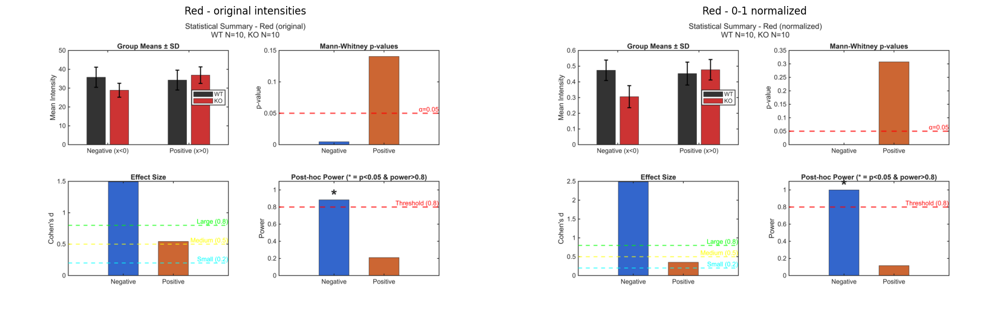

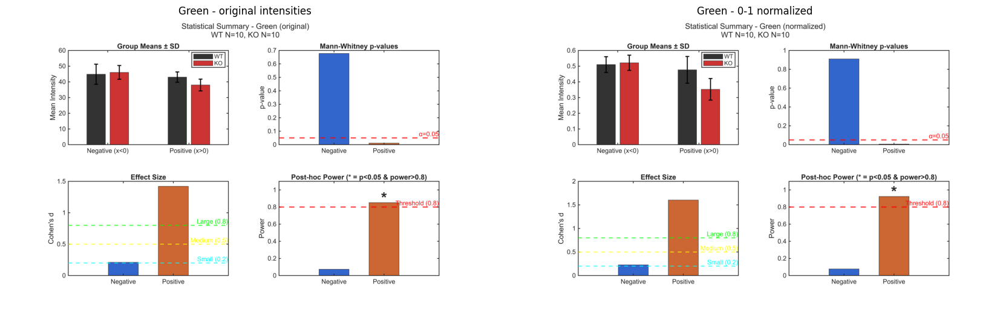

In [14]:
for ch in CHANNELS:
    show_grid(
        [STATS / f"Stats_{ch}_original.png", STATS / f"Stats_{ch}_normalized.png"],
        [f"{ch} - original intensities", f"{ch} - 0-1 normalized"],
        ncols=2, width=17,
    )

## 9. Spatial difference maps

The 1D profiles collapse the y-axis away. The difference maps put it back: they show *where in
the tissue* the two genotypes differ, rather than only where along the medial-lateral axis.

Group-average images are computed from the aligned (shifted) sections, and the difference is
taken pixelwise as **WT - KO**. Positive values therefore mean **more signal in WT than in KO**,
which is a loss of signal in the knockout. The two one-sided maps below split that difference:

- **WT > KO** shows only the regions where the knockout has *lost* signal.
- **KO > WT** shows only the regions where the knockout has *more* signal.

All four average images share a single global intensity scale, so brightness is comparable
across genotypes and channels. The dashed line marks the aligned midline.

Red channel - regions where WT exceeds KO (signal lost in the knockout)


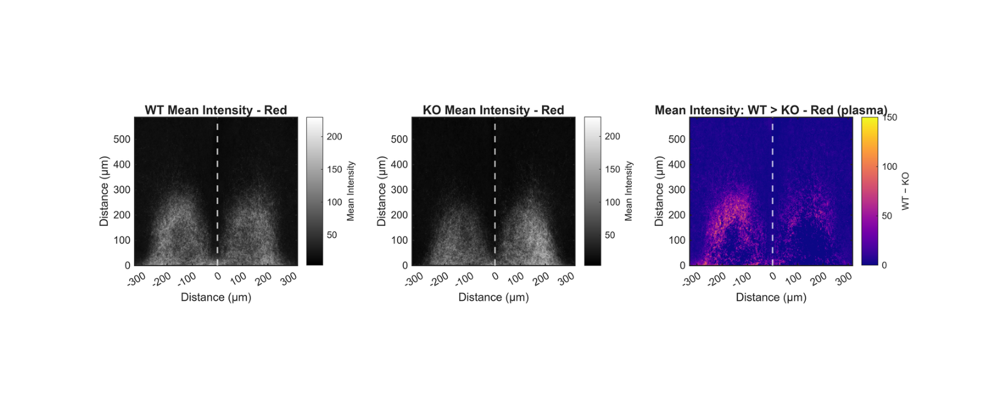

Green channel - regions where WT exceeds KO (signal lost in the knockout)


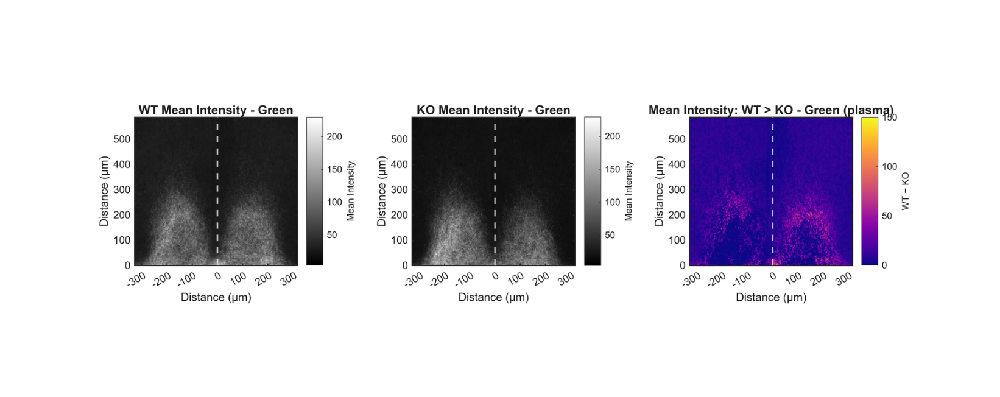

In [15]:
for ch in CHANNELS:
    print(f"{ch} channel - regions where WT exceeds KO (signal lost in the knockout)")
    show(HEAT / f"Heatmap_{ch}_WT_greater_plasma.png", width=17)

The loss is spatially restricted rather than global. In the red channel it sits over the left
lobe; in the green channel over the right lobe — which, by the mapping in Section 2, is the
ipsilateral lobe in each case. This is the same result the 1D statistics report, arrived at
without any binning or averaging along x.

For completeness, the reverse contrast:

Red channel - regions where KO exceeds WT


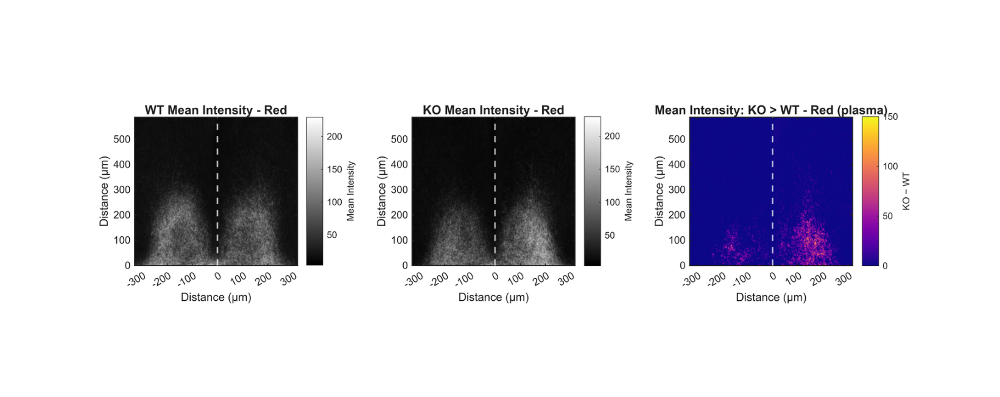

Green channel - regions where KO exceeds WT


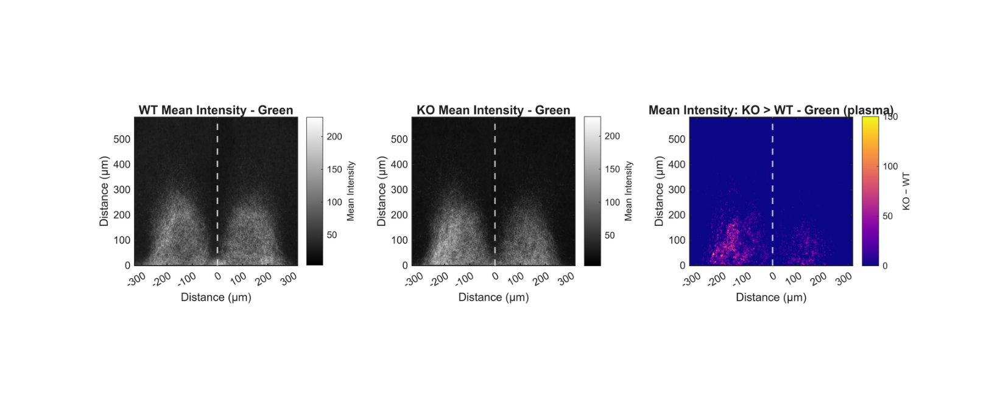

In [16]:
for ch in CHANNELS:
    print(f"{ch} channel - regions where KO exceeds WT")
    show(HEAT / f"Heatmap_{ch}_KO_greater_plasma.png", width=17)

The KO > WT maps are comparatively sparse and lack a coherent focus over either lobe, matching
the non-significant, underpowered contralateral statistics. The signed map below shows both
directions at once on a single diverging scale.

Red channel - signed difference (WT - KO)


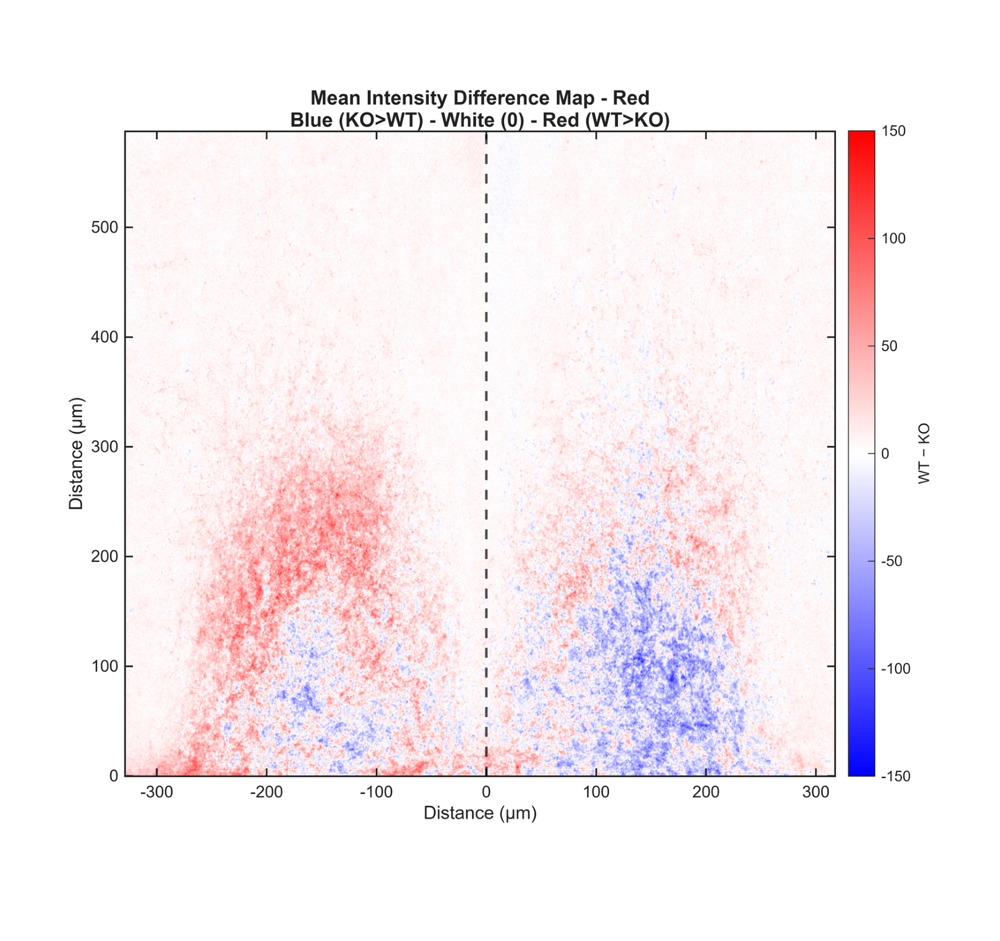

Green channel - signed difference (WT - KO)


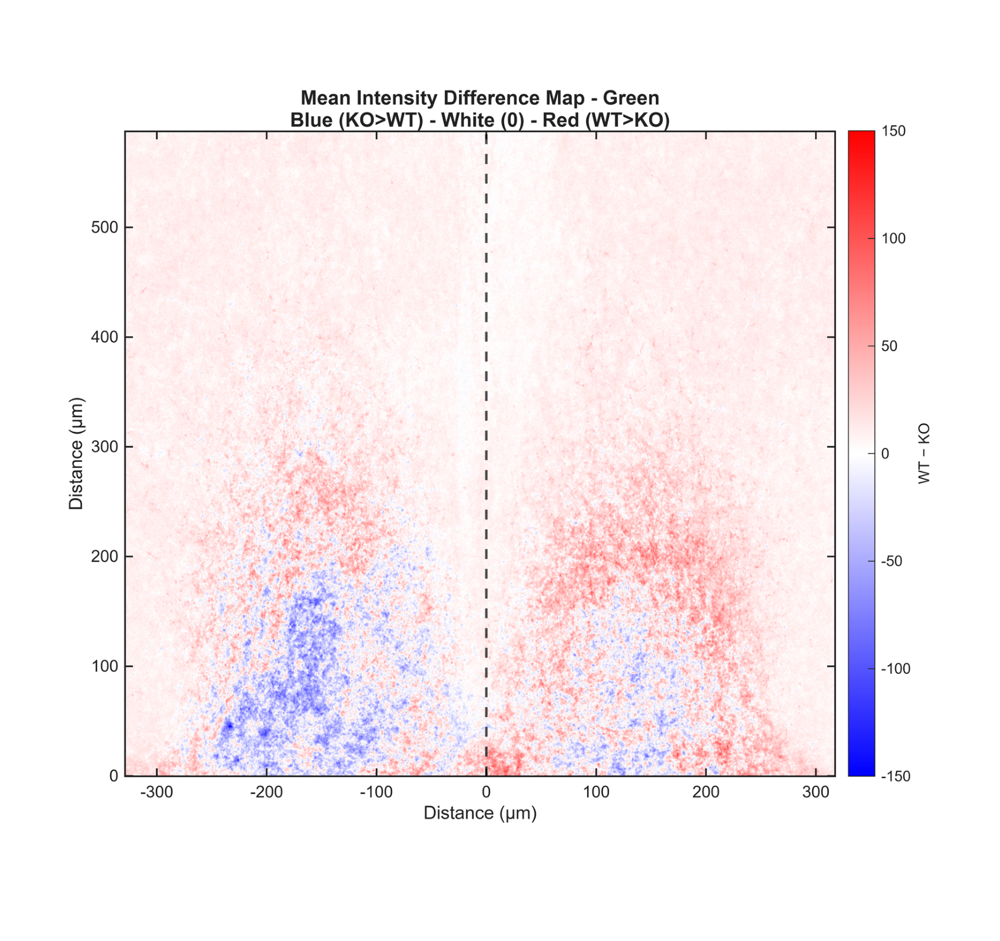

In [17]:
for ch in CHANNELS:
    print(f"{ch} channel - signed difference (WT - KO)")
    show(HEAT / f"Heatmap_{ch}_combined_blue_white_red.png", width=17)

## 10. Group-average images

The aligned group averages that the difference maps are built from, displayed on the shared
global intensity scale so that WT and KO can be compared directly by eye.

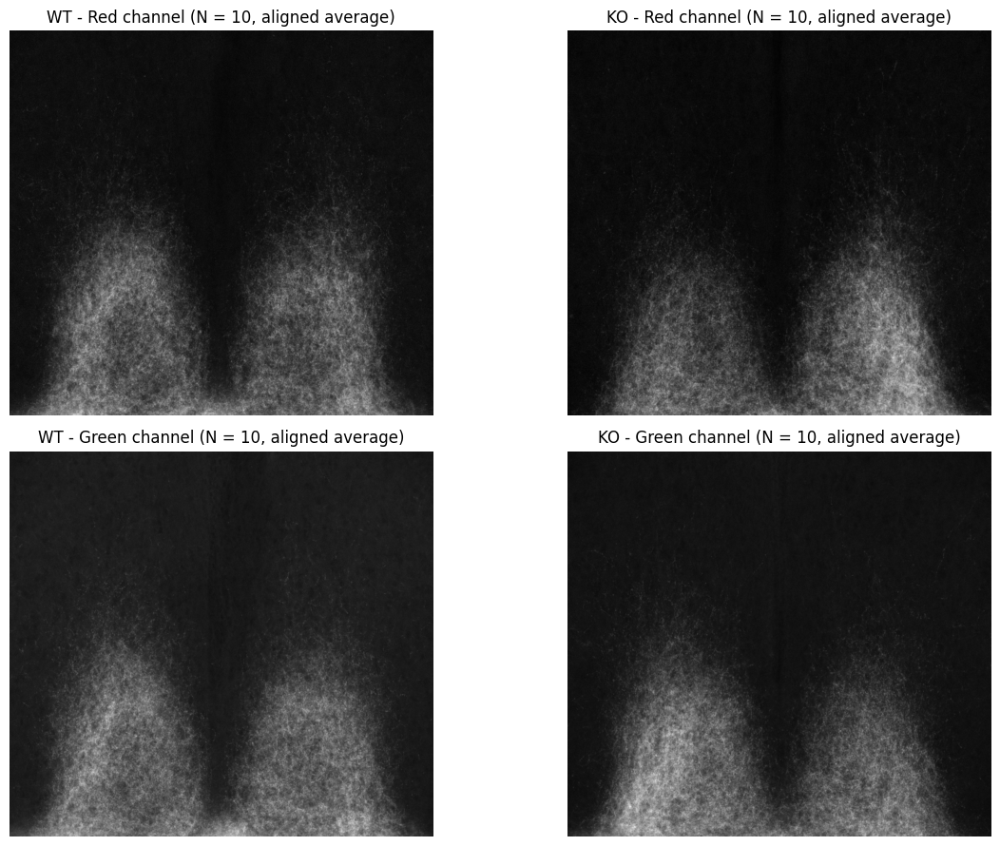

In [18]:
fig, axes = plt.subplots(2, 2, figsize=(13, 9))
for i, ch in enumerate(CHANNELS):
    for j, g in enumerate(GENOTYPES):
        img = np.array(Image.open(AVG / f"Average_{g}_{ch}_8bit_globalscale.tif"))
        ax = axes[i, j]
        ax.imshow(img, cmap="gray", vmin=0, vmax=255)
        ax.set_title(f"{g} - {ch} channel (N = 10, aligned average)", fontsize=12)
        ax.axis("off")
plt.tight_layout()
plt.show()

## 11. Interpretation

**Melanopsin knockout reduces the ipsilateral RHT projection to the SCN; the contralateral RHT
projection is normal.**

Both tracers give the same answer. In the red channel the significant reduction falls on the
negative/left side of the midline; in the green channel it falls on the positive/right side.
Those are opposite halves of the image, but they are the *same anatomical structure*: in each
case it is the RHT projection to the SCN lobe ipsilateral to the eye that tracer was injected
into. Left and right are image coordinates; ipsilateral and contralateral are defined relative
to the injected eye, and with two eyes injected separately each tracer's ipsilateral lobe lies
on its own side. Expressed anatomically, the two channels agree:

- **Red channel — ipsilateral RHT (negative/left side):** reduced in KO relative to WT
  (p = 0.0046, d = 1.49, power = 0.88). Contralateral RHT (positive/right side): no significant
  difference.
- **Green channel — ipsilateral RHT (positive/right side):** reduced in KO relative to WT
  (p = 0.0113, d = 1.42, power = 0.85). Contralateral RHT (negative/left side): no significant
  difference.

Both effects are large by conventional standards (d > 0.8) and adequately powered. They persist
after 0-1 normalization, so they are not an artifact of one genotype's sections simply being
dimmer: the spatial distribution of label across the SCN is itself altered, shifted away from
the ipsilateral side.

Neither channel shows a significant contralateral difference. The contralateral KO means are
marginally higher than WT in both channels, but with p = 0.14 (red) and p = 0.68 (green) and
power below 0.25, these comparisons are uninformative. The data are consistent with the
contralateral RHT projection being spared, and they do not support a claim of a contralateral
*increase* — that would require a study powered to detect it.

Two features of the design make the ipsilateral result difficult to attribute to a technical
artifact. First, it is internally replicated: two independently injected eyes, two separate
tracers, imaged in separate channels, each reproduce the effect on their own ipsilateral side.
A sectioning, mounting, or illumination artifact biased toward one side of the image would push
both channels the same way in image coordinates, and would therefore appear as a reduction on
the same half in both channels. That is not what is observed. Second, the effect survives the
alignment and normalization controls in Sections 6 and 7, and is visible in the raw spatial
difference maps without any 1D reduction.

## 12. Methods

### Image analysis

Coronal sections through the SCN were imaged in two fluorescence channels following dual-eye
injection of spectrally distinct anterograde tracers. Each channel was normalized by linear
histogram stretching between the 1st and 99th percentiles of the intensity distribution,
computed across all sections of a given genotype. Normalized images were collapsed along the
dorsoventral axis into one-dimensional intensity profiles across the medial-lateral axis, at a
bin width of 80 px for alignment and 20 px (12.6 um) for analysis.

Sections were aligned to a common origin using the trough of low fluorescence separating the two
SCN lobes. The trough was located as the minimum of the 80 px profile within a central search
window, and each section was translated along the medial-lateral axis so that its trough
coincided with the group mean trough position, with a maximum permitted shift of 100 px. The
aligned midline defines x = 0; distances are reported in microns (0.6313 um/px).

### Statistical analysis

Aligned profiles were divided at the midline into a negative (x < 0) and a positive (x > 0)
half. Because the two eyes were injected with different tracers, the half corresponding to the
SCN ipsilateral to the injected eye differs between channels: the ipsilateral half is x < 0 for
the red channel and x > 0 for the green channel.

For each animal a single summary value was computed as the mean intensity across all bins within
each half, so that every biological replicate contributed exactly one value per comparison
(WT N = 10, KO N = 10). Genotypes were compared with the Mann-Whitney U test (Wilcoxon rank-sum),
a non-parametric test that does not assume normality. Effect sizes are reported as Cohen's d
(absolute difference in group means divided by the pooled standard deviation; small = 0.2,
medium = 0.5, large = 0.8), and post-hoc power was estimated from the non-central
t-distribution given the observed effect size and sample sizes. Results were considered robust
only when p < 0.05 and power > 0.8. Analyses were run in parallel on original intensities and on
0-1 normalized profiles (each profile independently rescaled to [0, 1]) in order to distinguish
a change in the amount of label from a change in its spatial distribution. Image processing and
statistical analysis were performed in MATLAB.

## 13. Analysis by sex

The analysis above pools males and females within each genotype. This section breaks the same
aligned data down into four groups — WT-F, WT-M, KO-F, KO-M — so that any sex differences, or
any sex-dependence of the genotype effect, are visible rather than hidden inside the pooled
means.

**This section is descriptive only.** Splitting by sex halves the already-small groups, so no
statistical tests are run here and none should be read into these figures: there are no p-values,
effect sizes, or significance markers. The purpose is transparency — to show the by-sex structure
of the data directly, at the same processing stage and on the same scales as the pooled results,
and let the reader judge it. Each figure is annotated with its group size.

Everything shown here is produced by the `runStep4` block of the MATLAB pipeline, which reuses the
per-animal alignment computed for the pooled analysis and simply regroups the animals; nothing is
re-aligned or re-processed. The figures are read from `data/07_By_Sex/`.

In [19]:
BYSEX = DATA / "07_By_Sex"

# This section renders only if the by-sex outputs are present. They are generated by
# re-running the MATLAB pipeline (Step 4) on sex-encoded filenames (e.g. WT_animal3M).
bysex_available = BYSEX.exists() and (BYSEX / "Group_Sizes.csv").exists()

if not bysex_available:
    print("By-sex outputs not found in data/07_By_Sex/.")
    print("Re-run the MATLAB pipeline with config.runStep4 = true on sex-encoded")
    print("filenames to generate them, then re-run this section.")
else:
    group_sizes = pd.read_csv(BYSEX / "Group_Sizes.csv")
    pivot = group_sizes.pivot(index="Genotype", columns="Sex", values="N")
    pivot = pivot.reindex(index=["WT", "KO"])
    print("Animals per group:\n")
    print(pivot.to_string())
    print(f"\nTotal animals in by-sex analysis: {int(group_sizes['N'].sum())}")

Animals per group:

Sex       F  M
Genotype      
WT        3  7
KO        4  6

Total animals in by-sex analysis: 20


### 13.1 Four-group aligned profiles

The aligned group-mean profiles for all four groups on shared axes, for each channel and each
data type. These are the same aligned profiles as in Section 7, grouped by genotype and sex
rather than by genotype alone. Group means are shown without error bands or tests; solid lines
are female, dashed lines are male, with WT in blue and KO in red. The laterality convention from
Section 2 still applies — ipsilateral is x < 0 for the red channel and x > 0 for the green
channel.

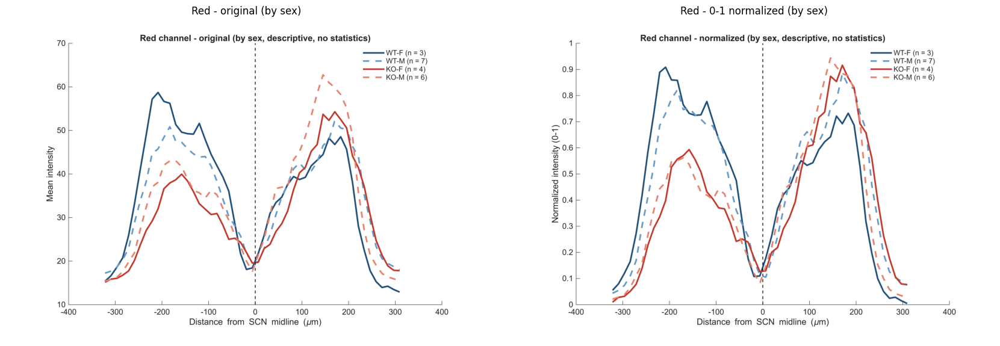

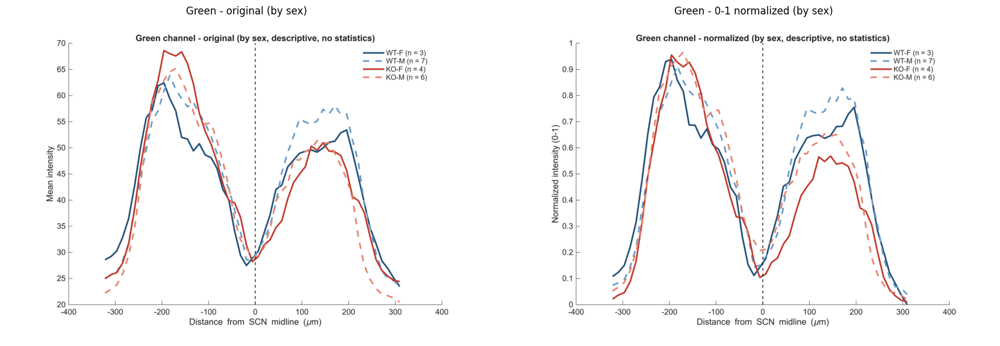

In [20]:
if bysex_available:
    ap = BYSEX / "Aligned_Profiles"
    for ch in CHANNELS:
        paths = [ap / f"BySex_Profiles_{ch}_original.png",
                 ap / f"BySex_Profiles_{ch}_normalized.png"]
        if all(p.exists() for p in paths):
            show_grid(paths,
                      [f"{ch} - original (by sex)", f"{ch} - 0-1 normalized (by sex)"],
                      ncols=2, width=17)
        else:
            print(f"{ch}: by-sex profile plots not found (expected in {ap}/)")

### 13.2 Individual traces by sex

The plots above show group means. These show every individual animal's aligned profile, with
males and females overlaid and separated by color, in two panels per figure — WT on the left,
KO on the right — for each channel and data type. Female traces are warm (red), male traces are
cool (blue); each thin line is one animal.

The point of this view is to check, directly and without any averaging, whether male and female
animals behave alike within each genotype. If the two colors interleave rather than separating
into distinct bands, the sexes are contributing similar profiles and pooling them is justified.
The two panels share y-axis limits so WT and KO are on the same scale.

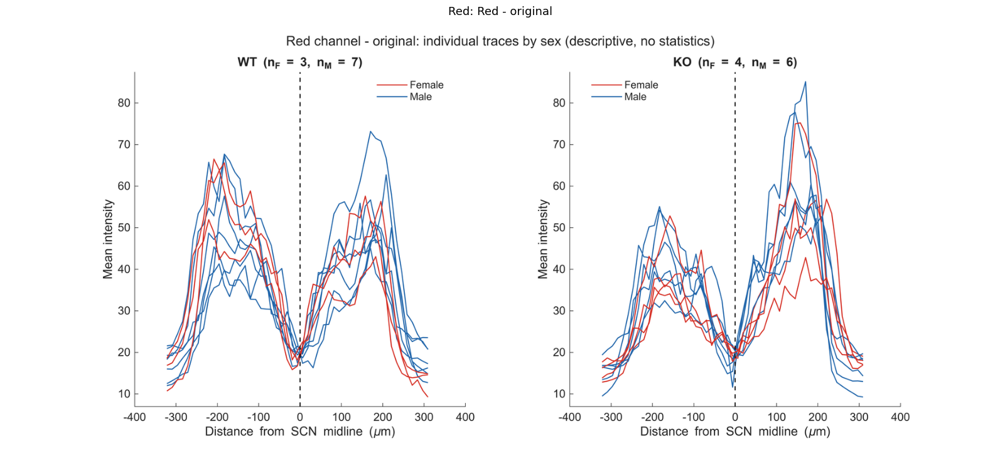

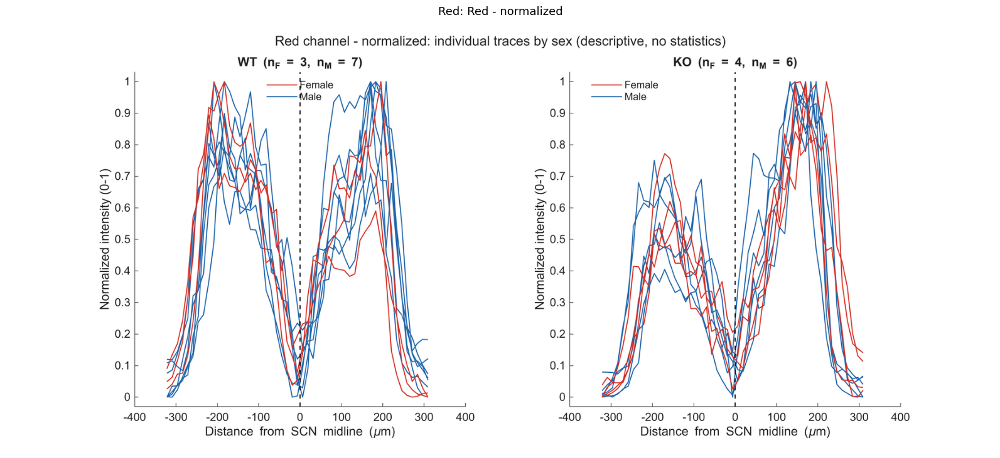

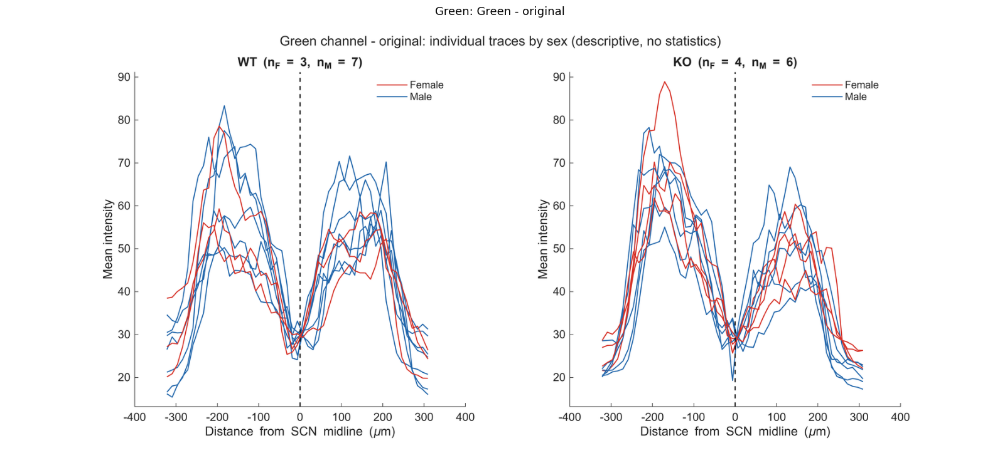

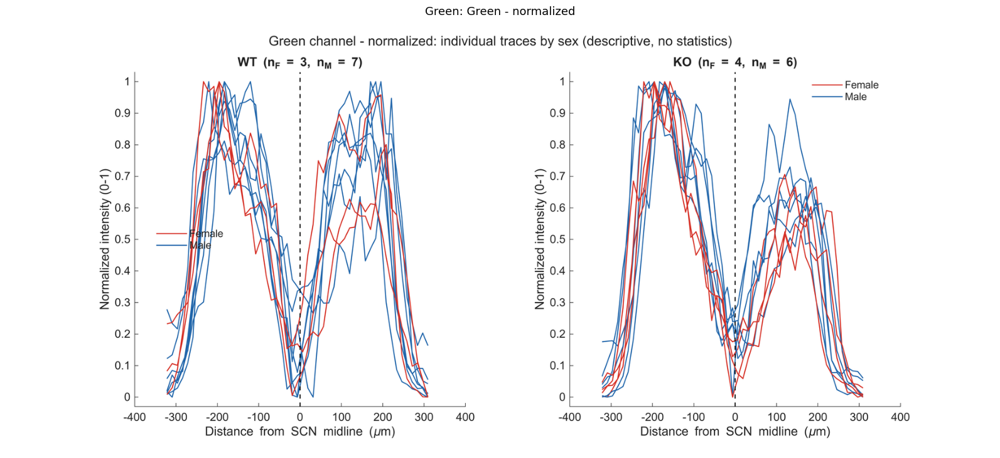

In [21]:
if bysex_available:
    it = BYSEX / "Individual_Traces"
    for ch in CHANNELS:
        paths = [it / f"BySex_IndividualTraces_{ch}_original.png",
                 it / f"BySex_IndividualTraces_{ch}_normalized.png"]
        existing = [p for p in paths if p.exists()]
        if existing:
            titles = [p.stem.replace("BySex_IndividualTraces_", "").replace("_", " - ")
                      for p in existing]
            for p, t in zip(existing, titles):
                show(p, title=f"{ch}: {t}", width=17)
        else:
            print(f"{ch}: individual-trace plots not found (expected in {it}/)")

### 13.3 Group-average images by sex

Aligned group-average images for each of the four groups, on the **same global intensity scale**
as the pooled averages in Section 10, so a by-sex average can be compared directly against the
pooled images and against each other. Fewer animals contribute to each of these than to the
pooled averages, so they are visibly noisier; that is expected and is the reason this breakdown
is kept descriptive.

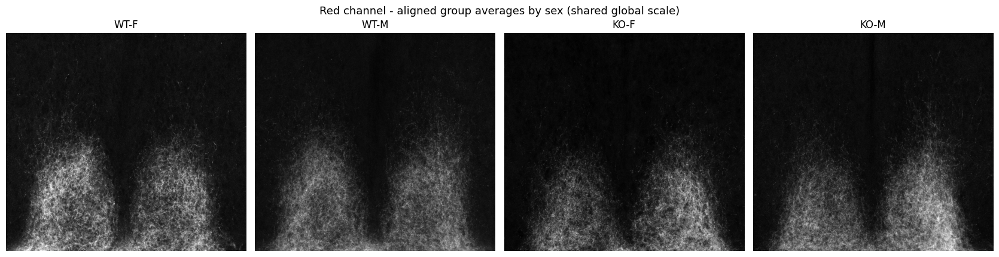

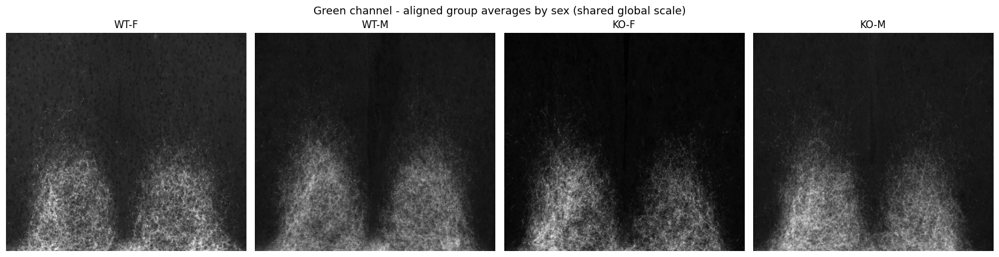

In [22]:
if bysex_available:
    from PIL import Image as _Image
    avgdir = BYSEX / "Average_Images"
    for ch in CHANNELS:
        cells_present = [(g, s) for g in GENOTYPES for s in ("F", "M")
                         if (avgdir / f"Average_{g}-{s}_{ch}_8bit_globalscale.tif").exists()]
        if not cells_present:
            print(f"{ch}: no by-sex average images found in {avgdir}/")
            continue
        fig, axes = plt.subplots(1, len(cells_present),
                                 figsize=(4.2 * len(cells_present), 4.4))
        axes = np.atleast_1d(axes)
        for ax, (g, s) in zip(axes, cells_present):
            img = np.array(_Image.open(avgdir / f"Average_{g}-{s}_{ch}_8bit_globalscale.tif"))
            ax.imshow(img, cmap="gray", vmin=0, vmax=255)
            ax.set_title(f"{g}-{s}", fontsize=12)
            ax.axis("off")
        fig.suptitle(f"{ch} channel - aligned group averages by sex (shared global scale)",
                     fontsize=13)
        plt.tight_layout()
        plt.show()
        plt.close(fig)

### 13.4 Reading this section

These by-sex figures are provided for full transparency, not as a second set of findings. The
statistical result of this study is the pooled ipsilateral reduction reported in Sections 8 and
11. What the by-sex breakdown adds is the ability to confirm, by eye, that the pooled effect is
not carried by a single sex — that the four-group profiles and the per-cell average images do not
conceal a large, opposing sex effect inside the genotype means. Any apparent sex difference in
these plots is hypothesis-generating only and would need a study designed and powered for it to
be tested.